# 합성곱 신경망(Convolutional Neural Networks, CNNs)

- 이미지 인식, 음성 인식 등에 자주 사용되는데,  
  특히, 이미지 인식 분야에서 거의 모든 딥러닝 기술에 사용

<br>

<br>

## 컨볼루션 신경망의 등장
- 1989년 얀 르쿤(Yann LeCun) 교수의 논문에서 발표

  - 필기체 인식에서 의미가 있었지만 범용화하는데에는 무리

- 1998년, "Gradient-Based Learning Applied to Document Recognition"이라는 논문에서 LeNet-5 제시

- 합성곱 층(convolution layer), 풀링 층(pooling layer) 소개
  <br>

  <img src="https://miro.medium.com/max/4308/1*1TI1aGBZ4dybR6__DI9dzA.png">
  
  <center>[LeNet-5 구조]</center>

  <sub>출처: https://medium.com/@pechyonkin/key-deep-learning-architectures-lenet-5-6fc3c59e6f4</sub>

<br>

<br>


## 완전연결계층과의 차이
- **완전연결계층(Fully-Connected Layer)은 이미지와 같은 데이터의 형상(3차원)을 무시함**

- 모든 입력데이터를 동등하게 취급. 즉, **데이터의 특징을 잃어버리게 됨**

- **컨볼루션층(convolution layer)은 <u>이미지 픽셀 사이의 관계를 고려</u>**

- **완전연결계층은 공간정보를 손실하지만, 컨볼루션층은 공간정보를 유지** $→$ 이미지와 같은 2차원(흑백) 또는 3차원(컬러)의 형상을 유지

  - 공간정보를 유지하기 때문에 완전연결계층에 비해 적은 수의 파라미터를 요구


<br>

<br>

## 컨볼루션 신경망 구조 예시

![c38754ca-f2ea-425a-b7a6-1fe0f2f5074e[1].png](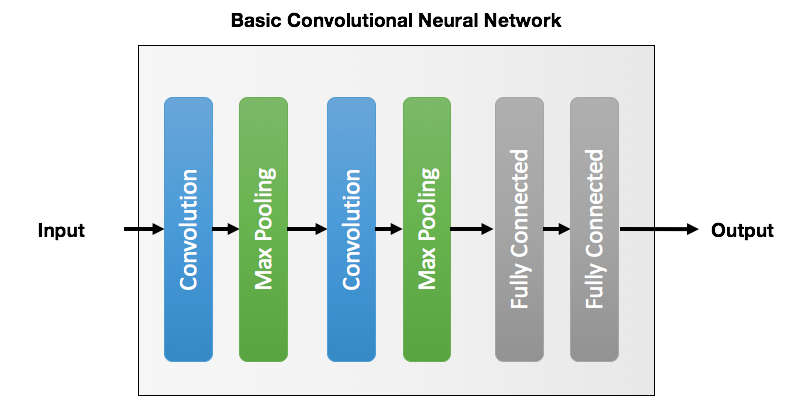)

<sub>출처: https://www.oreilly.com/library/view/neural-network-projects/9781789138900/8e87ad66-6de3-4275-81a4-62b54436bf16.xhtml</sub>



## 합성곱 연산
- **필터(filter) 연산**
  - 입력 데이터에 필터를 통한 어떠한 연산을 진행
  
  - **필터에 대응하는 원소끼리 곱하고, 그 합을 구함**

  - **연산이 완료된 결과 데이터를 특징 맵(feature map)이라 부름**

- **필터(filter)**
  - 커널(kernel)이라고도 칭함
  
  - 흔히 사진 어플에서 사용하는 '이미지 필터'와 비슷한 개념

  - **필터의 사이즈는 "거의 항상 홀수"**
    - 짝수이면 패딩이 비대칭이 되어버림
  
    - 왼쪽, 오른쪽을 다르게 주어야함
  
    - 중심위치가 존재, 즉 구별된 하나의 픽셀(중심 픽셀)이 존재

  - **필터의 학습 파라미터 개수는 입력 데이터의 크기와 상관없이 일정**  
    **따라서, 과적합을 방지할 수 있음**

  <br>

  ![58780750-defb7480-8614-11e9-943c-4d44a9d1efc4[1].gif](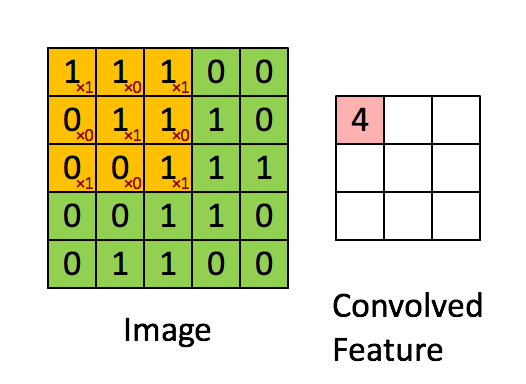)

  ![58845860-ca23ed00-86b7-11e9-805f-ef5c8adcab9f[1].png](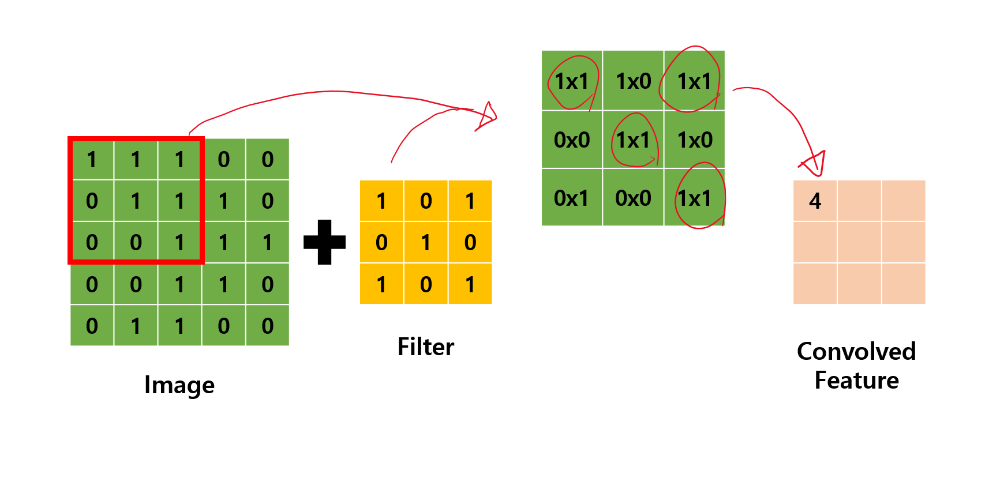)


- 연산 시각화
  <img src="https://www.researchgate.net/profile/Ihab_S_Mohamed/publication/324165524/figure/fig3/AS:611103423860736@1522709818959/An-example-of-convolution-operation-in-2D-2.png" width="500">

  <sub>출처: https://www.researchgate.net/figure/An-example-of-convolution-operation-in-2D-2_fig3_324165524</sub>


- **일반적으로, 합성곱 연산을 한 후의 데이터 사이즈는** 
  ### $\quad (n-f+1) \times (n-f+1)$
    $n$: 입력 데이터의 크기  
    $f$: 필터(커널)의 크기

  <img src="https://miro.medium.com/max/1400/1*Fw-ehcNBR9byHtho-Rxbtw.gif" width="400">

  <sub>출처: https://towardsdatascience.com/intuitively-understanding-convolutions-for-deep-learning-1f6f42faee1</sub>
  
  위 예에서 입력 데이터 크기($n$)는 5, 필터의 크기($k$)는 3이므로  
  출력 데이터의 크기는 $(5 - 3 + 1) = 3$


<br>

<br>

## 패딩(padding)과 스트라이드(stride)
- **필터(커널) 사이즈과 함께 입력 이미지와 출력 이미지의 사이즈를 결정하기 위해 사용**

- 사용자가 결정할 수 있음


<br>


### 패딩
- **입력 데이터의 주변을 특정 값으로 채우는 기법**
  - 주로 0으로 많이 채움

  ![99433dnn4[1].gif](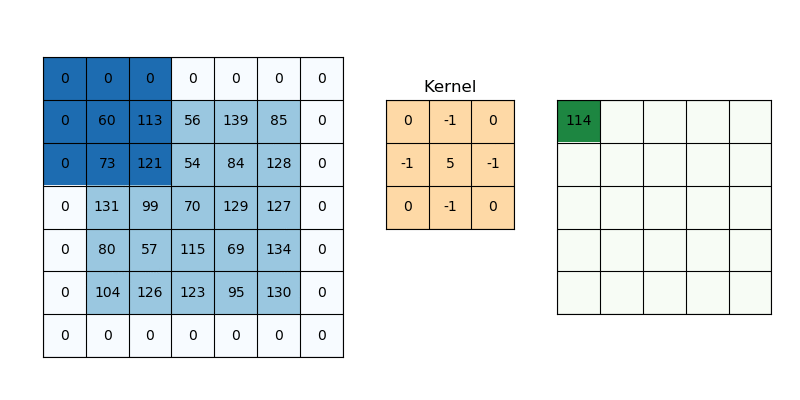)



- 출력 데이터의 크기
  ### $\quad (n+2p-f+1) \times (n+2p-f+1)$

  위 그림에서, 입력 데이터의 크기($n$)는 5, 필터의 크기($f$)는 3, 패딩값($p$)은 1이므로    
  출력 데이터의 크기는 ($5 + 2\times 1 - 3 + 1) = 5$

<br>

### 'valid' 와 'same'
- **'valid'**
  - **패딩을 주지 않음**
  - **padding=0 (0으로 채워진 테두리가 아니라 패딩을 주지 않는다는 의미)**

- **'same'**
  - **패딩을 주어 입력 이미지의 크기와 연산 후의 이미지 크기를 같게함**

  - **만약, 필터(커널)의 크기가 $k$ 이면, 패딩의 크기는 $p = \frac{k-1}{2}$ (단, <u>stride=1)</u>**

<br>

### 스트라이드
- **필터를 적용하는 간격을 의미**

- 아래는 그림의 간격 2 (2칸씩 이동)

  ![92373dnn5[1].gif](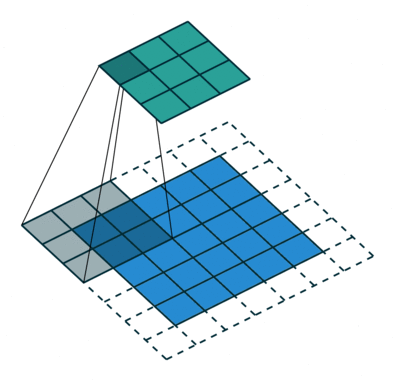)


<br>

<br>

## 출력 데이터의 크기

## $\qquad OH = \frac{H + 2P - FH}{S} + 1 $ 
## $\qquad OW = \frac{W + 2P - FW}{S} + 1 $ 

- **입력 크기 : $(H, W)$**

- **필터 크기 : $(FH, FW)$**

- **출력 크기 : $(OH, OW)$**

- **패딩, 스트라이드 : $P, S$**

- (주의) 
  - **위 식의 값에서 $\frac{H + 2P - FH}{S}$ 또는 $\frac{W + 2P - FW}{S}$가 정수로 나누어 떨어지는 값이어야 함**
  - **만약, 정수로 나누어 떨어지지 않으면, 패딩, 스트라이드값을 조정하여 정수로 나누어 떨어지게 해야함**


<br>

<br>


## 풀링(Pooling)

- 필터(커널) 사이즈 내에서 특정 값을 추출하는 과정

<br>

### 맥스 풀링(Max Pooling)
- **가장 많이 사용되는 방법**

- **출력 데이터의 사이즈 계산은 컨볼루션 연산과 동일**
## $\quad OH = \frac{H + 2P - FH}{S} + 1 $ 
## $\quad OW = \frac{W + 2P - FW}{S} + 1 $ 

- 일반적으로 stride=2, kernel_size=2 를 통해  
  **특징맵의 크기를 <u>절반으로 줄이는 역할</u>**

- **모델이 물체의 주요한 특징을 학습할 수 있도록 해주며, 컨볼루션 신경망이 이동 불변성 특성을 가지게 해줌**
  - *예를 들어, 아래의 그림에서 초록색 사각형 안에 있는, 2와 8의 위치를 바꾼다해도 맥스 풀링 연산은 8을 추출*

- **모델의 파라미터 개수를 줄여주고, 연산 속도를 빠르게 해줌**

  <br>

  <img src="https://cs231n.github.io/assets/cnn/maxpool.jpeg" width="600">

  <sub>출처: https://cs231n.github.io/convolutional-networks/</sub>

<br>

### 평균 풀링(Avg Pooling)

- **필터 내의 있는 픽셀값의 평균을 구하는 과정**

- **과거에 많이 사용, 요즘은 잘 사용되지 않는다.**

  <img src="https://www.researchgate.net/profile/Juan_Pedro_Dominguez-Morales/publication/329885401/figure/fig21/AS:707709083062277@1545742402308/Average-pooling-example.png" width="600">

  <sub>출처: https://www.researchgate.net/figure/Average-pooling-example_fig21_329885401</sub>

<br>

### 전역 평균 풀링(Global Avg Pooling)

- **특징 맵 각각의 평균값을 출력하는 것이므로, 특성맵에 있는 대부분의 정보를 잃음**
- **출력층에는 유용할 수 있음**

<br>


### 완전 연결 계층(Fully-Connected Layer)

- **입력으로 받은 텐서를 1차원으로 평면화(flatten) 함** (밀집 계층(Dense Layer))
- **일반적으로 분류기로서 네트워크의 마지막 계층에서 사용**

<br>


### 유효 수용 영역(ERF, Effective Receptive Field)

- 입력 이미지에서 거리가 먼 요소를 상호 참조하여 결합하여 네트워크 능력에 영향을 줌
- 입력 이미지의 영역을 정의해 주어진 계층을 위한 뉴런의 활성화에 영향을 미침
- 한 계층의 필터 크기나 윈도우 크기로 불리기 때문에 RF(receptive field, 수용 영역)이라는 용어를 흔히 볼 수 있음

  <img src="https://wiki.math.uwaterloo.ca/statwiki/images/8/8c/understanding_ERF_fig0.png">

- RF의 중앙에 위치한 픽셀은 주변에 있는 픽셀보다 더 높은 가중치를 가짐
  - 중앙부에 위치한 픽셀은 여러 개의 계층을 전파한 값
  - 중앙부에 있는 픽셀은 주변에 위치한 픽셀보다 더 많은 정보를 가짐

- 가우시안 분포를 따름

  <img src="https://www.researchgate.net/publication/316950618/figure/fig4/AS:495826810007552@1495225731123/The-receptive-field-of-each-convolution-layer-with-a-3-3-kernel-The-green-area-marks.png">

<br>

<br>


## 합성곱 연산의 의미

<br>

<br>

## 2차원 이미지에 대한 필터 연산 예시
  - **가장 자리 검출(Edge-Detection)**

  - **소벨 필터(Sobel Filter)**

    - **Horizontal** : 가로 방향의 미분을 구하는 필터 역할

    - **Vertical** : 세로 방향의 미분을 구하는 필터 역할  

  <img src="https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT_ZRkuiCkv0ZEHFiyCp-7Y5bCL0liaYSQ4mg&usqp=CAU" width="350">

  <sub>출처: https://www.cloras.com/blog/image-recognition/</sub>


### modules import

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib
import requests
from io import BytesIO


### util functions

In [ ]:
def url_to_image(url, gray=False):
  resp = urllib.request.urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype='uint8')

  if gray == True:
    image = cv2.imdecode(image, cv2.IMREAD_GRAYSCALE)
  else:
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  return image

In [ ]:
def filtered_image(image, filter, output_size):
  filtered_img = np.zeros((output_size, output_size))
  filter_size = filter.shape[0]

  for i in range(output_size):
    for j in range(output_size):
      multiply_values = image[i:(i+filter_size), j:(j+ filter_size)] * filter
      sum_value = np.sum(multiply_values)

      if (sum_value > 255):
        sum_value = 255

      filtered_img[i, j] = sum_value

  return filtered_img

<br>

### 이미지 확인
- 예시이므로 정사각형 사이즈로 진행

image.shape: (440, 440)


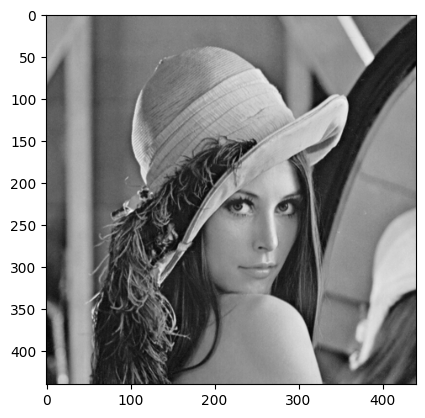

In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"

image = url_to_image(img_url, gray=True)
print("image.shape:", image.shape)

plt.imshow(image, cmap='gray')
plt.show()

<br>

### 필터연산 적용

- Vertical은 세로방향의 특징(edge) 잘 부각
- Horizontal은 가로방향의 특징(edge) 잘 부각

output size: 438


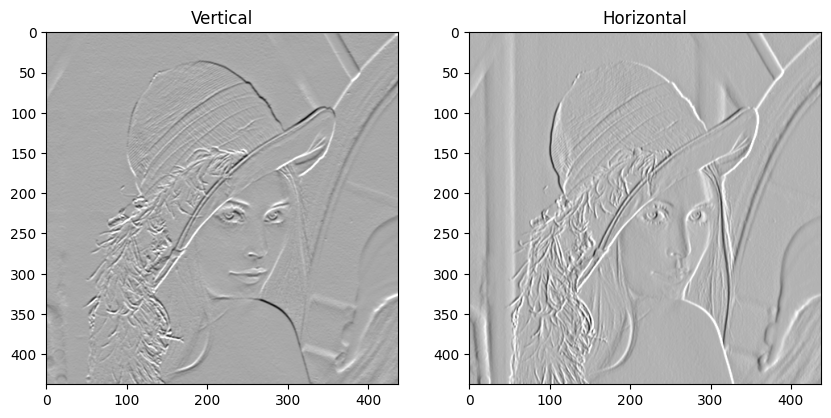

In [ ]:
vertical_filter = np.array([[1., 2., 1.], 
                            [0., 0., 0.],
                            [-1., -2., -1.]])
horizontal_filter = np.array([[1., 0., -1.],
                              [2., 0., -2.],
                              [1., 0., -1.]])

output_size = int((image.shape[0] - 3) / 1 + 1)
print("output size:", output_size)

vertical_filtered = filtered_image(image, vertical_filter, output_size)
horizontal_filtered = filtered_image(image, horizontal_filter, output_size)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title("Vertical")
plt.imshow(vertical_filtered, cmap='gray')

plt.subplot(1, 2, 2)
plt.title("Horizontal")
plt.imshow(horizontal_filtered, cmap='gray')

plt.show()

<br>

### 이미지 필터를 적용한 최종 결과
- **edge만 부각되어 출력**

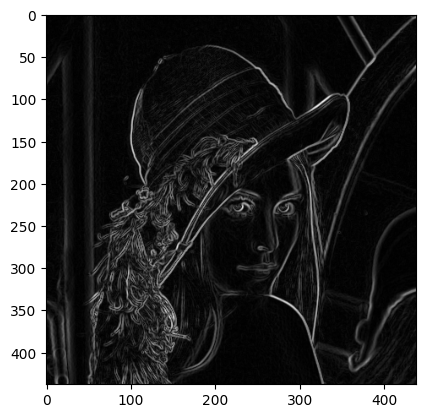

In [ ]:
sobel_img = np.sqrt(np.square(horizontal_filtered) + np.square(vertical_filtered))

plt.imshow(sobel_img, cmap='gray')
plt.show()

<br>

<br>

## 3차원 데이터의 합성곱 연산
- **이미지는 3차원으로 구성**
  - (가로, 세로, 채널 수)
    - 채널 : RGB 

- 색상값의 정도에 따라 color색 결정

  <img src="https://www.projectorcentral.com/images/articles/RGB-Explained-600.jpg">

  <sub>출처: https://www.projectorcentral.com/All-About-Bit-Depth.htm?page=What-Bit-Depth-Looks-Like</sub>



<br>

- 컬러이미지 출력

image.shape: (440, 440, 3)


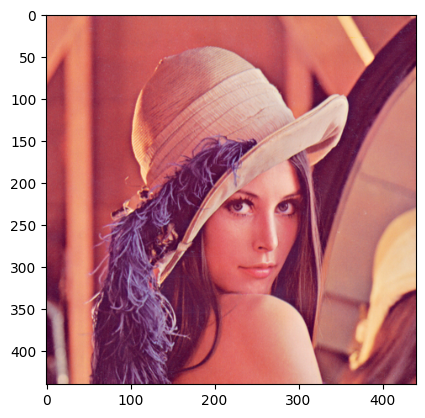

In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"

image = url_to_image(img_url, gray=False)
print("image.shape:", image.shape)

plt.imshow(image)
plt.show()

<br>

#### RGB 채널의 0번째 차원은 Red
#### RGB 채널의 1번째 차원은 Green
#### RGB 채널의 2번째 차원은 Blue

<br>

- 1, 2번째 (Green, Blue) 차원은 전부 0으로 변환 $→$ 0번째 (Red)만 남김

In [ ]:
image_copy = image.copy()
image_copy[:, :, 1] = 0 
image_copy[:, :, 2] = 0
image_red = image_copy

<br>

- Green만 남김

In [ ]:
image_copy = image.copy()
image_copy[:, :, 0] = 0 
image_copy[:, :, 2] = 0
image_green = image_copy

<br>

- Blue만 남김

In [ ]:
image_copy = image.copy()
image_copy[:, :, 0] = 0 
image_copy[:, :, 1] = 0
image_blue = image_copy

<br>


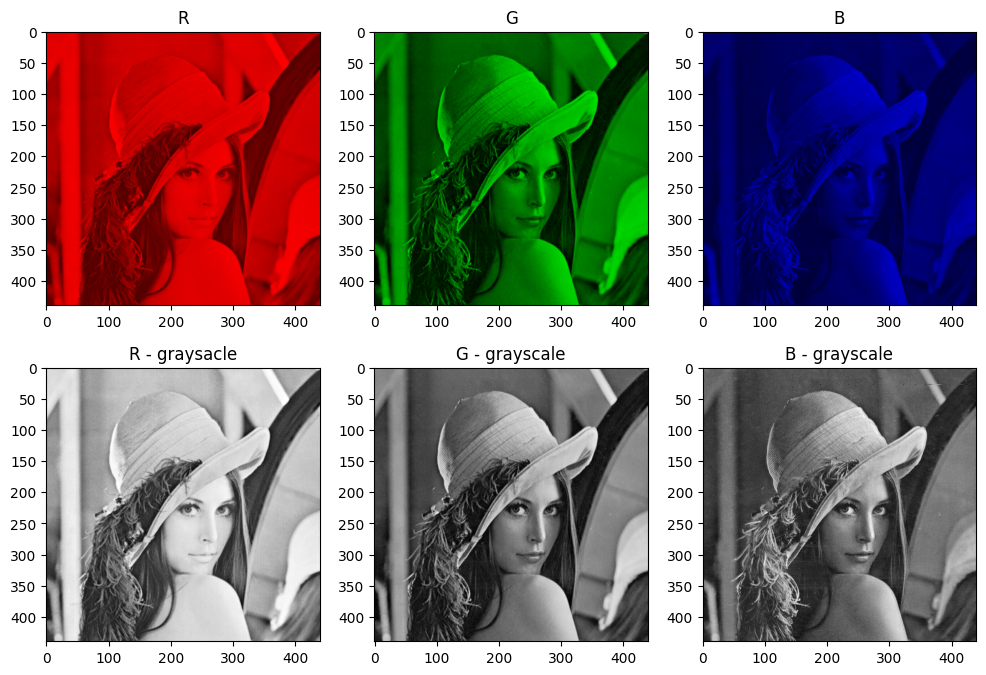

In [ ]:
fig = plt.figure(figsize=(12, 8))

title_list = ['R', 'G', 'B',
              'R - graysacle', 'G - grayscale', 'B - grayscale']
image_list = [image_red, image_green, image_blue,
              image_red[:, :, 0], image_green[:, :, 1], image_blue[:, :, 2]]

for i, image in enumerate(image_list):
  ax = fig.add_subplot(2, 3, i+1)
  ax.title.set_text("{}".format(title_list[i]))

  if i>= 3:
    plt.imshow(image, cmap='gray')
  else:
    plt.imshow(image)
  
plt.show()

<br>

### 연산 과정

- **각 채널마다 컨볼루션 연산을 적용**
  - 3채널을 모두 합쳐서 '하나의 필터'라고 칭함  
    
  <img src="https://miro.medium.com/max/2000/1*8dx6nxpUh2JqvYWPadTwMQ.gif" width="600">

<br>

- **각각의 결과를 더함** 
  
  <img src="https://miro.medium.com/max/2000/1*CYB2dyR3EhFs1xNLK8ewiA.gif" width="600">

<br>

- **더한 결과에 편향을 더함**  
  <img src="https://miro.medium.com/max/588/1*RYYucIh3U-YFxrIkyQKzRw.gif" width="300">

  <sub>출처: https://towardsdatascience.com/intuitively-understanding-convolutions-for-deep-learning-1f6f42faee1</sub>



<br>

### modules import

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib
import requests
from io import BytesIO

<br>

### util functions

In [ ]:
def url_to_image(url, gray=False):
  resp = urllib.request.urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype='uint8')

  if gray == True:
    image = cv2.imdecode(image, cv2.IMREAD_GRAYSCALE)
  else:
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  return image

In [ ]:
def conv_op(image, kernel, pad=0, stride=1):
  H, W, C = image.shape
  kernel_size = kernel.shape[0]

  out_h = (H + 2*pad - kernel_size) // stride + 1
  out_w = (W + 2*pad - kernel_size) // stride + 1

  filtered_img = np.zeros((out_h, out_w))
  img = np.pad(image, [(pad, pad), (pad, pad), (0, 0)], 'constant')

  for i in range(out_h):
    for j in range(out_w):
      for c in range(C):
        multiply_values = image[i:(i + kernel_size), j:(j + kernel_size), c] * kernel
        sum_value = np.sum(multiply_values)

        filtered_img[i, j] += sum_value
  
  filtered_img = filtered_img.reshape(1, out_h, out_w, -1).transpose(0, 3, 1, 2)

  return filtered_img.astype(np.uint8)

<br>

### 이미지 확인

image.shape: (440, 440, 3)


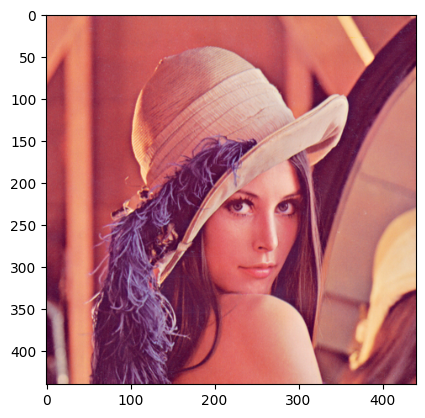

In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"

image = url_to_image(img_url, gray=False)
print("image.shape:", image.shape)

plt.imshow(image)
plt.show()

<br>

### 필터연산 적용
- 3x3 크기의 3채널 필터 5개

- (5, 3, 3, 3) ----> (5개, 3채널, 세로, 가로)

<br>

- filter1

In [ ]:
filter1 = np.random.rand(3, 3, 3)

print(filter1.shape)
print(filter1)

(3, 3, 3)
[[[0.91982286 0.15862324 0.46612286]
  [0.94777135 0.88025602 0.72630484]
  [0.46606934 0.40766409 0.38874162]]

 [[0.28053823 0.45457532 0.31714298]
  [0.26034887 0.76680562 0.63224565]
  [0.72033412 0.40555548 0.25923028]]

 [[0.276148   0.74340633 0.1155952 ]
  [0.48639255 0.10222693 0.01211056]
  [0.07169826 0.17898057 0.68043111]]]


(1, 1, 438, 438)


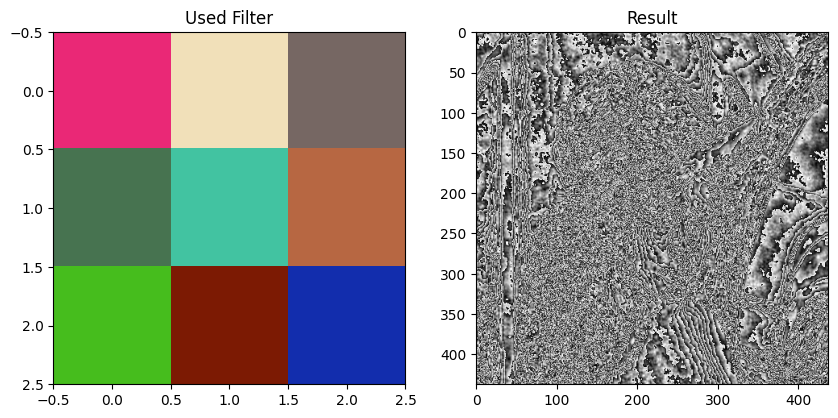

In [ ]:
filtered_img1 = conv_op(image, filter1)
print(filtered_img1.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter1, cmap='gray')

plt.subplot(1, 2, 2)
plt.title("Result")
plt.imshow(filtered_img1[0, 0, :, :], cmap='gray')
plt.show()

<br>

- filter2

In [ ]:
filter2 = np.random.rand(3, 3, 3)

(1, 1, 438, 438)


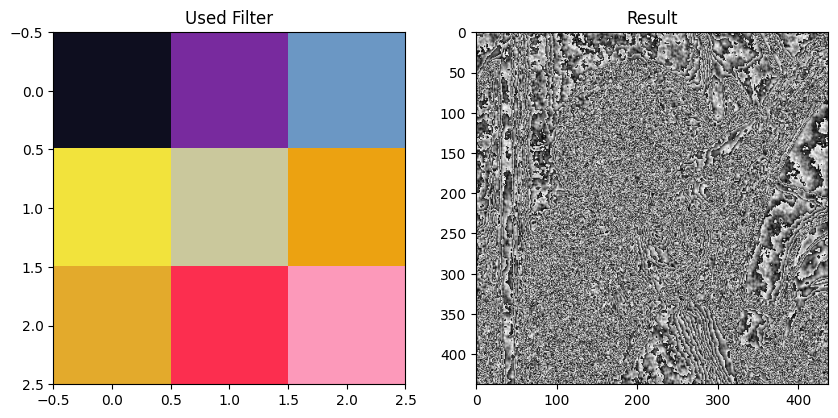

In [ ]:
filtered_img2 = conv_op(image, filter2)
print(filtered_img2.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter2, cmap='gray')

plt.subplot(1, 2, 2)
plt.title("Result")
plt.imshow(filtered_img2[0, 0, :, :], cmap='gray')
plt.show()

<br>

- filter3

In [ ]:
filter3 = np.random.rand(3, 3, 3)

(1, 1, 438, 438)


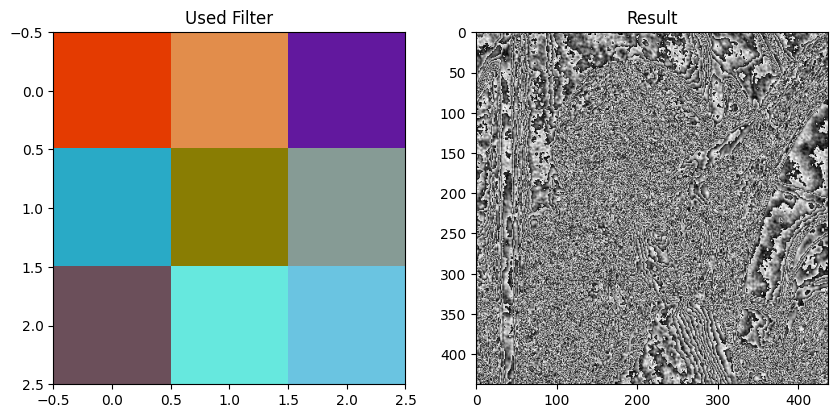

In [ ]:
filtered_img3 = conv_op(image, filter3)
print(filtered_img3.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter3, cmap='gray')

plt.subplot(1, 2, 2)
plt.title("Result")
plt.imshow(filtered_img3[0, 0, :, :], cmap='gray')
plt.show()

<br>

- filter4

In [ ]:
filter4 = np.random.rand(3, 3, 3)

(1, 1, 438, 438)


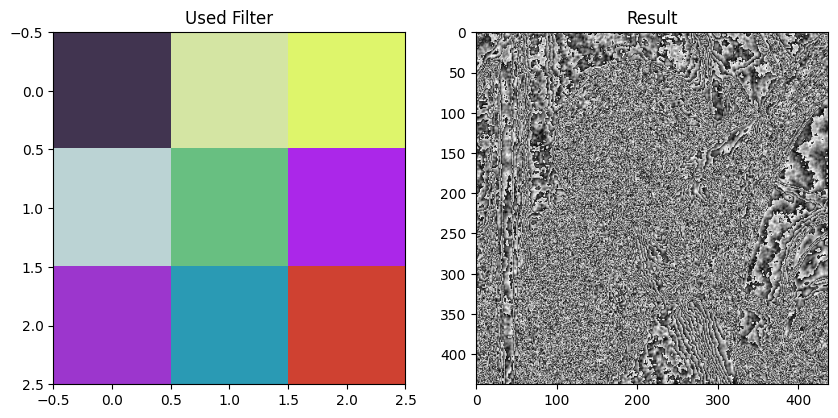

In [ ]:
filtered_img4 = conv_op(image, filter4)
print(filtered_img4.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter4, cmap='gray')

plt.subplot(1, 2, 2)
plt.title("Result")
plt.imshow(filtered_img4[0, 0, :, :], cmap='gray')
plt.show()

<br>

- filter5

In [ ]:
filter5 = np.random.rand(3, 3, 3)

(1, 1, 438, 438)


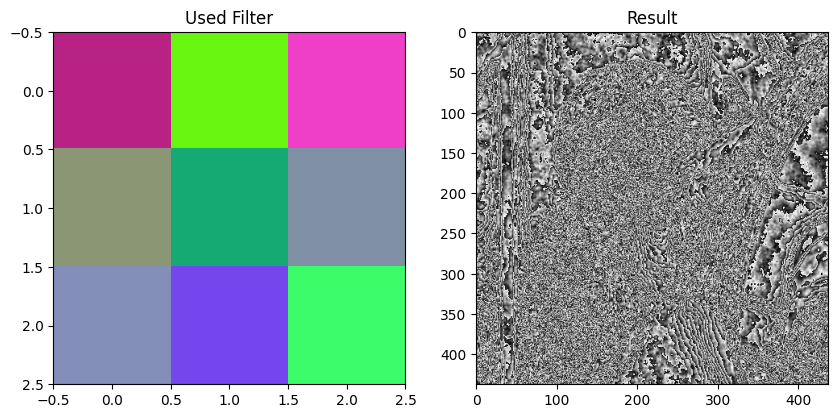

In [ ]:
filtered_img5 = conv_op(image, filter5)
print(filtered_img5.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter5, cmap='gray')

plt.subplot(1, 2, 2)
plt.title("Result")
plt.imshow(filtered_img5[0, 0, :, :], cmap='gray')
plt.show()

<br>

### 필터연산을 적용한 최종 결과

(1, 1, 438, 438)


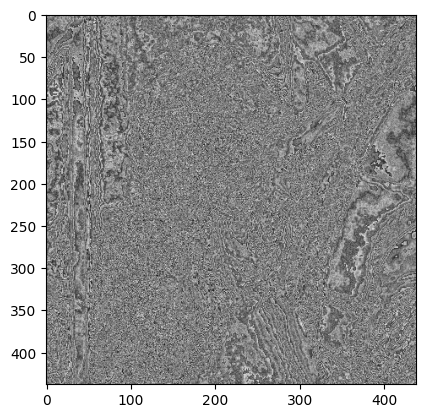

In [ ]:
filtered_img = np.stack([filtered_img1, filtered_img2, filtered_img3, filtered_img4, filtered_img5]).sum(axis=0)
print(filtered_img.shape)

plt.imshow(filtered_img[0, 0, :, :], cmap='gray')
plt.show()

<br>

<br>

<br>

# 합성곱 신경망 구현
- 참고: 밑바닥부터 시작하는 딥러닝1

<br>

<br>

## 합성곱 층(Convolution Layer)

In [ ]:
def im2col(input_data, filter_h, filter_w, stride=1, pad=0):
  N, C, H, W = input_data.shape
  out_h = (H + 2*pad - filter_h) // stride + 1
  out_w = (W + 2*pad - filter_w) // stride + 1

  img = np.pad(input_data, [(0, 0), (0, 0), (pad, pad), (pad, pad)], 'constant')
  col = np.zeros((N, C, filter_h, filter_w, out_h, out_w))

  for y in range(filter_h):
    y_max = y + stride * out_h
    for x in range(filter_w):
      x_max = x + stride * out_w
      col[:, :, y, x, :, :] = img[:, :, y:y_max:stride, x:x_max:stride]

  col = col.transpose(0, 4, 5, 1, 2, 3).reshape(N * out_h * out_w, -1)
  
  return col

In [ ]:
def col2im(col, input_shape, filter_h, filter_w, stride=1, pad=0):

  N, C, H, W = input_shape
  out_h = (H + 2*pad - filter_h) // stride + 1
  out_w = (W + 2*pad - filter_w) // stride + 1
  col = col.reshape(N, out_h, out_w, C, filter_h, filter_w).transpose(0, 3, 4, 5, 1, 2)

  img = np.zeros((N, C, H + 2*pad + stride - 1, W + 2*pad + stride - 1))

  for y in range(filter_h):
    y_max = y + stride * out_h
    for x in range(filter_w):
      x_max = x + stride * out_w
      img[:, :, y:y_max:stride, x:x_max:stride] += col[:, :, y, x, :, :]

  return img[:, :, pad:H + pad, pad:W + pad]

In [ ]:
class Conv2D():

  def __init__(self, W, b, stride=1, pad=0):
    self.W = W
    self.b = b
    self.stride = stride
    self.pad = pad

    self.input_data = None
    self.col = None
    self.col_W = None

    self.dW = None
    self.db = None

  def forward(self, input_data):
    FN, C, FH, FW = self.W.shape
    N, C, H, W = input_data.shape
    out_h = (H + 2*self.pad - FH) // self.stride + 1
    out_w = (W + 2*self.pad - FW) // self.stride + 1

    col = im2col(input_data, FW, FW, self.stride, self.pad)
    col_W = self.W.reshape(FN, -1).T

    out = np.dot(col, col_W) + self.b
    output = out.reshape(N, out_h, out_w, -1).transpose(0, 3, 1, 2)

    self.input_data = input_data
    self.col = col
    self.col_W = col_W

    return output

  def backward(self, dout):
    FN, C, FH, FW = self.W.shape
    dout = dout.transpose(0, 2, 3, 1).reshape(-1, FN)

    self.db = np.sum(dout, axis=0)
    self.dW = np.dot(self.col.T, dout)
    self.dW = self.dW.transpose(1, 0).reshape(FN, C< FH, FW)

    dout = np,dot(dout, self.col_W.T)
    dx = col2im(dcol, self.input_data.shape, FH, FW, self.stride, self.pad)

    return dx

<br>

### 컨볼루션 레이어 테스트

In [ ]:
def init_weight(num_filters, data_dim, kernel_size, stride=1, pad=0, weight_std=0.01):

  weights = weight_std * np.random.randn(num_filters, data_dim, kernel_size, kernel_size)
  biases = np.zeros(num_filters)

  return weights, biases

<br>

- 흑백 이미지

image.shape: (440, 440, 1)


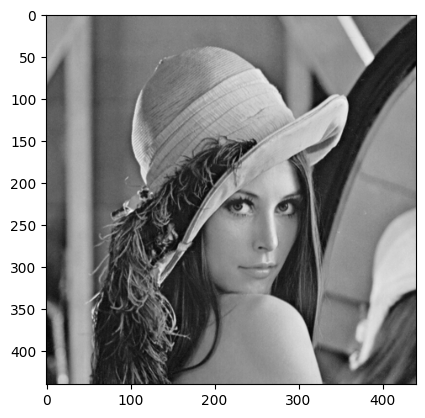

In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_gray = url_to_image(img_url, gray=True)
image_gray = image_gray.reshape(image_gray.shape[0], -1, 1)
print("image.shape:", image_gray.shape)

image_gray = np.expand_dims(image_gray.transpose(2, 0, 1), axis=0)

plt.imshow(image_gray[0, 0, :, :], cmap='gray')
plt.show()

<br>

In [ ]:
W, b = init_weight(1, 1, 3)
conv = Conv2D(W, b)
output = conv.forward(image_gray)

print("Conv Layer size:", output.shape)

Conv Layer size: (1, 1, 438, 438)


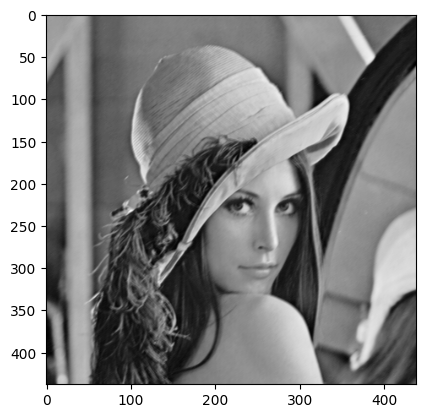

In [ ]:
plt.imshow(output[0, 0,:, :], cmap='gray')
plt.show()

<br>


In [ ]:
W2, b2 = init_weight(1, 1, 3, stride=2)
conv2 = Conv2D(W2, b2, stride=2)
output2 = conv2.forward(image_gray)

print("Conv Layer size:", output2.shape)

Conv Layer size: (1, 1, 219, 219)


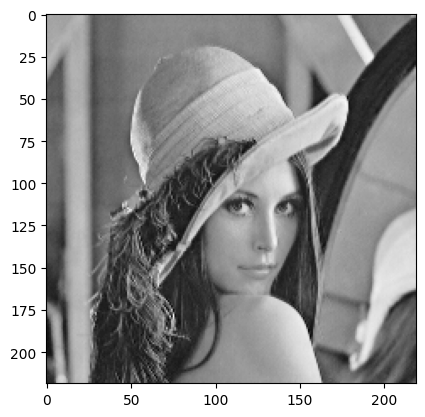

In [ ]:
plt.imshow(output2[0, 0,:, :], cmap='gray')
plt.show()

<br>

- 컬러 이미지

image.shape: (440, 440, 3)


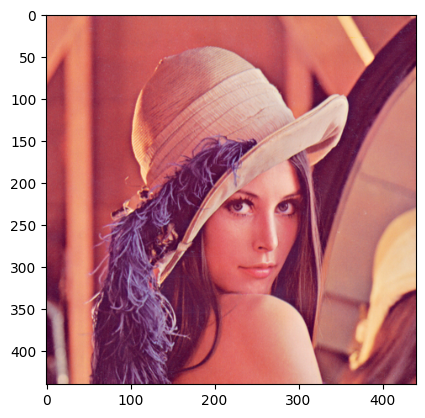

image.shape:  (1, 3, 440, 440)


In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_color = url_to_image(img_url)
print("image.shape:", image_color.shape)

plt.imshow(image_color)
plt.show()

image_color = np.expand_dims(image_color.transpose(2, 0, 1), axis=0)
print("image.shape: ", image_color.shape)

<br>


In [ ]:
W3, b3 = init_weight(10, 3, 3)
conv3 = Conv2D(W3, b3)
output3 = conv3.forward(image_color)

print("Conv Layer size:", output3.shape)

Conv Layer size: (1, 10, 438, 438)


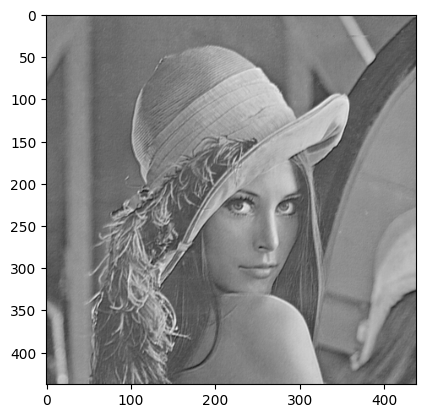

In [ ]:
plt.imshow(output3[0, 3, :, :], cmap='gray')
plt.show()

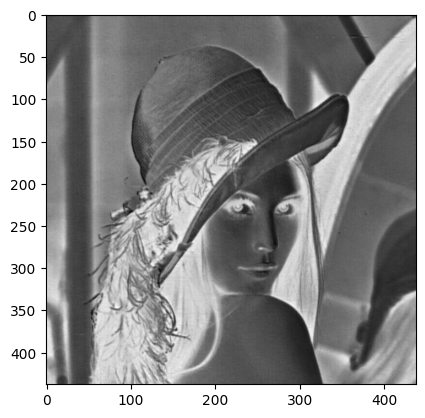

In [ ]:
plt.imshow(output3[0, 8, :, :], cmap='gray')
plt.show()

<br>

### 동일한 이미지 여러 장 테스트 (배치 처리)

In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_gray = url_to_image(img_url, gray=True)
image_gray = image_gray.reshape(image_gray.shape[0], -1, 1)
print("image.shape:", image_gray.shape)

image_gray = image_gray.transpose(2, 0, 1)
print("image_gray.shape:", image_gray.shape)

image.shape: (440, 440, 1)
image_gray.shape: (1, 440, 440)


In [ ]:
batch_image_gray = np.repeat(image_gray[np.newaxis, :, :, :], 15, axis=0)
print(batch_image_gray.shape)

(15, 1, 440, 440)


<br>

In [ ]:
W4, b4 = init_weight(10, 1, 3, stride=2)
conv4 = Conv2D(W4, b4)
output4 = conv4.forward(batch_image_gray)

print("Conv Layer size:", output4.shape)

Conv Layer size: (15, 10, 438, 438)


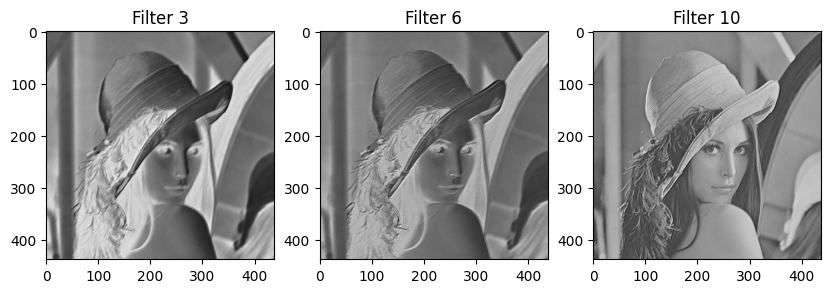

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Filter 3")
plt.imshow(output4[3, 2, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Filter 6")
plt.imshow(output4[3, 5, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Filter 10")
plt.imshow(output4[3, 9, :, :], cmap='gray')

plt.show()

<br>

In [ ]:
W5, b5 = init_weight(32, 3, 3, stride=3)
conv5 = Conv2D(W5, b5, stride=3)
output5 = conv5.forward(image_color)

print("Conv Layer size:", output5.shape)

Conv Layer size: (1, 32, 146, 146)


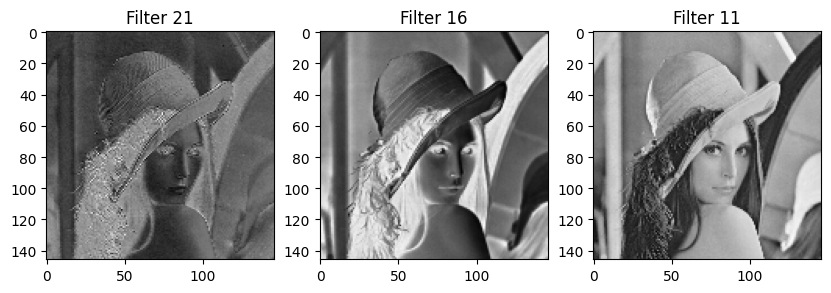

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Filter 21")
plt.imshow(output5[0, 20, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Filter 16")
plt.imshow(output5[0, 14, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Filter 11")
plt.imshow(output5[0, 10, :, :], cmap='gray')

plt.show()

<br>

### 동일한 이미지 배치처리(color)

In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_color = url_to_image(img_url)
print("image.shape:", image_color.shape)

image_color = image_color.transpose(2, 0, 1)
print("image.shape: ", image_color.shape)

image.shape: (440, 440, 3)
image.shape:  (3, 440, 440)


In [ ]:
batch_image_color = np.repeat(image_color[np.newaxis, :, :, :], 15, axis=0)
print(batch_image_color.shape)

(15, 3, 440, 440)


In [ ]:
W6, b6 = init_weight(64, 3, 5)
conv6 = Conv2D(W6, b6)
output6 = conv6.forward(batch_image_color)

print("Conv Layer size:", output6.shape)

Conv Layer size: (15, 64, 436, 436)


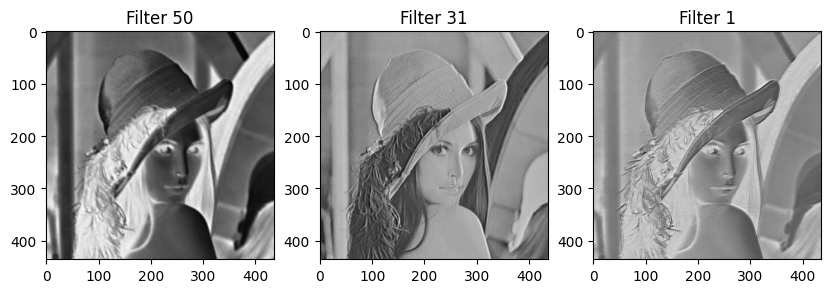

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Filter 50")
plt.imshow(output6[10, 49, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Filter 31")
plt.imshow(output6[10, 30, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Filter 1")
plt.imshow(output6[10, 0, :, :], cmap='gray')

plt.show()

<br>

<br>

## 풀링 층(Pooling Layer)

In [ ]:
class Pooling2D:
  def __init__(self, kernel_size=2, stride=1,pad=0):
    self.kernel_size = kernel_size
    self.stride = stride
    self.pad = pad

    self.input_data = None
    self.arg_max = None

  def forward(self, input_data):
    N, C, H, W = input_data.shape
    out_h = (H - self.kernel_size) // self.stride + 1
    out_w = (W - self.kernel_size) // self.stride + 1

    col = im2col(input_data, self.kernel_size, self.kernel_size, self.stride, self.pad)
    col = col.reshape(-1, self.kernel_size * self.kernel_size)

    arg_max = np.argmax(col, axis=1)
    out = np.max(col, axis=1)
    output = out.reshape(N, out_h, out_w, C).transpose(0, 3, 1, 2)

    self.input_data = input_data
    self.arg_max = arg_max

    return output

  def backward(self, dout):
    dout = dout.transpose(0, 2, 3, 1)

    pool_size = self.kernel_size * self.kernel_size
    dmax = np.zeros((dout.size, pool_size))
    dmax[np.arange(self.arg_max.size), self.arg_max.flatten()] * dout.flatten()
    dmax = dmax.reshape(dout.shape + (pool_size,))

    dcol = dmax.reshape(dmax.shape[0] * dmax.shape[1] * dmax.shape[2] -1)
    dx = col2im(dcol, self.input_data.shape, self.kernel_size, self.kernel_size, self.stride, self.pad)

    return dx

<br>

### 풀링 레이어 테스트
- 2차원 이미지
  - (Height, Width, 1)

image.shape: (440, 440, 1)


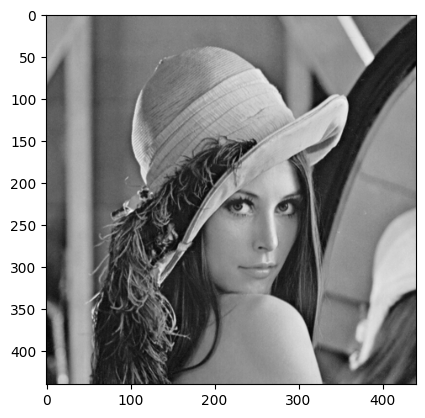

In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_gray = url_to_image(img_url, gray=True)
image_gray = image_gray.reshape(image_gray.shape[0], -1, 1)
print("image.shape:", image_gray.shape)

image_gray = np.expand_dims(image_gray.transpose(2, 0, 1), axis=0)

plt.imshow(image_gray[0, 0, :, :], cmap='gray')
plt.show()

In [ ]:
W, b = init_weight(8, 1, 3)
conv = Conv2D(W, b)
pool = Pooling2D(stride=2, kernel_size=2)

In [ ]:
output1 = conv.forward(image_gray)
print("Conv size:", output1.shape)

Conv size: (1, 8, 438, 438)


In [ ]:
output1 = pool.forward(output1)
print("pooling Layer size", output1.shape)

pooling Layer size (1, 8, 219, 219)


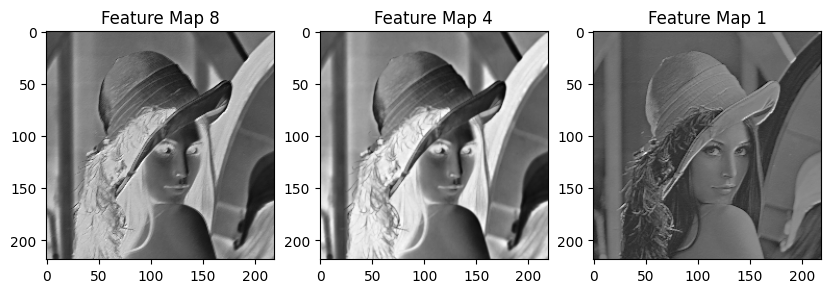

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 8")
plt.imshow(output1[0, 7, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 4")
plt.imshow(output1[0, 3, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 1")
plt.imshow(output1[0, 0, :, :], cmap='gray')

plt.show()

<bt>

In [ ]:
W2, b2 = init_weight(32, 1, 3, stride=2)
conv2 = Conv2D(W2, b2)
pool = Pooling2D(stride=2, kernel_size=2)

In [ ]:
output2 = conv2.forward(image_gray)
output2 = pool.forward(output2)

print("Conv size:", output2.shape)

Conv size: (1, 32, 219, 219)


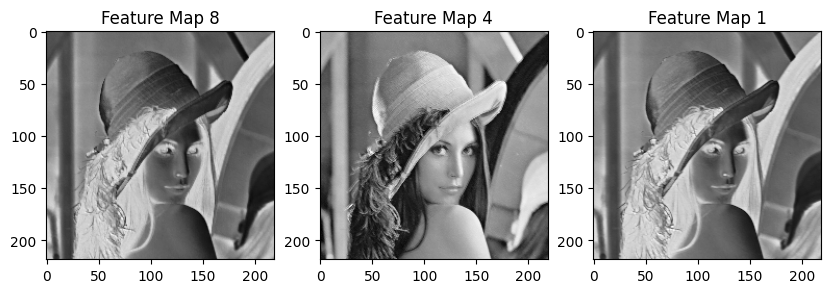

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 8")
plt.imshow(output2[0, 7, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 4")
plt.imshow(output2[0, 3, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 1")
plt.imshow(output2[0, 0, :, :], cmap='gray')

plt.show()

<br>

### 동일한 이미지 배치처리
- Color Image

- conv --> maxpooling --> conv --> maxpooling

- 시각화 과정
  - 5번째 이미지
  - [2, 5, 9] 필터를 통해 확인

image.shape: (440, 440, 3)


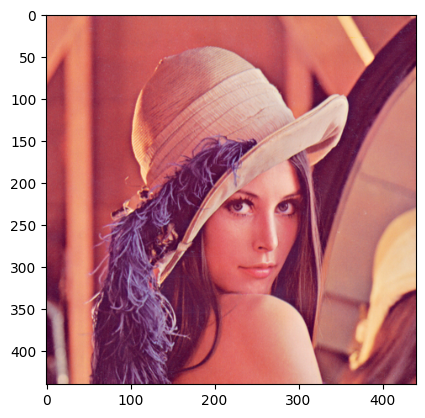

image.shape:  (3, 440, 440)


In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_color = url_to_image(img_url)
print("image.shape:", image_color.shape)

plt.imshow(image_color)
plt.show()

image_color = image_color.transpose(2, 0, 1)
print("image.shape: ", image_color.shape)

In [ ]:
batch_image_color = np.repeat(image_color[np.newaxis, :, :, :], 15, axis=0)
print(batch_image_color.shape)

(15, 3, 440, 440)


In [ ]:
W, b = init_weight(10, 3, 3)
conv1 = Conv2D(W, b)
pool = Pooling2D(stride=2, kernel_size=2)

In [ ]:
output1 = conv1.forward(batch_image_color)
print("Conv size:", output1.shape)

Conv size: (15, 10, 438, 438)


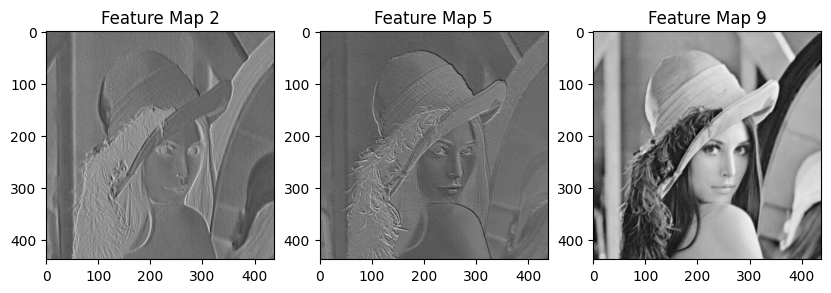

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 2")
plt.imshow(output1[0, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 5")
plt.imshow(output1[0, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 9")
plt.imshow(output1[0, 8, :, :], cmap='gray')

plt.show()

<br>

In [ ]:
output1 = pool.forward(output1)
print(output1.shape)

(15, 10, 219, 219)


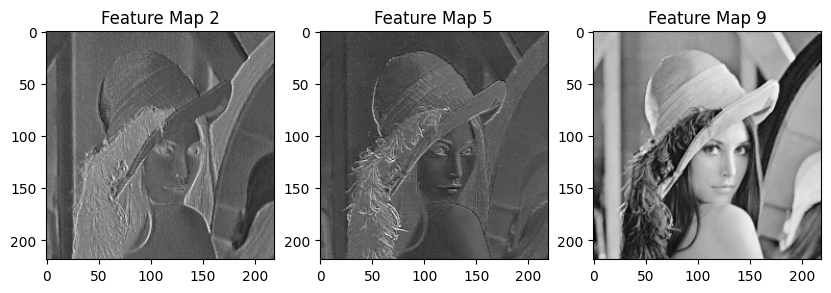

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 2")
plt.imshow(output1[0, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 5")
plt.imshow(output1[0, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 9")
plt.imshow(output1[0, 8, :, :], cmap='gray')

plt.show()

<br>

In [ ]:
W2, b2 = init_weight(30, 10, 3)
conv2 = Conv2D(W2, b2)
pool = Pooling2D(stride=2, kernel_size=2)

In [ ]:
output2 = conv2.forward(output1)
print(output2.shape)

(15, 30, 217, 217)


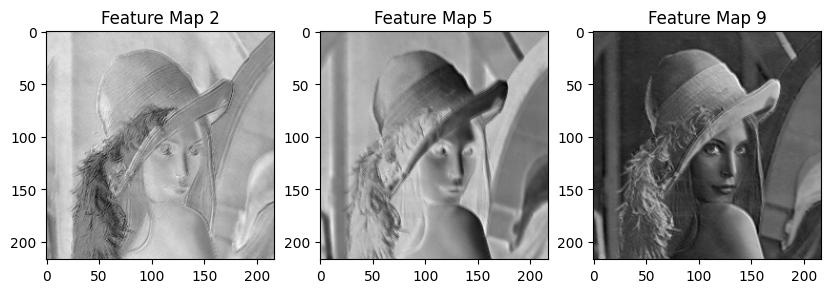

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 2")
plt.imshow(output2[4, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 5")
plt.imshow(output2[4, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 9")
plt.imshow(output2[4, 8, :, :], cmap='gray')

plt.show()

<br>

In [ ]:
output2 = pool.forward(output2)
print(output2.shape)

(15, 30, 108, 108)


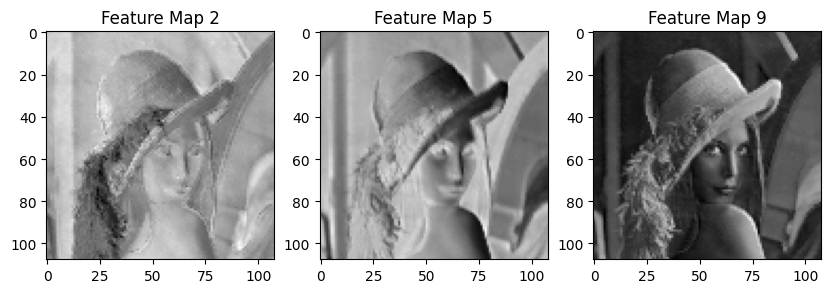

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 2")
plt.imshow(output2[4, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 5")
plt.imshow(output2[4, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 9")
plt.imshow(output2[4, 8, :, :], cmap='gray')

plt.show()

<br>

<br>

<br>

# 대표적인 CNN 모델 소개

<br>

<br> 
## LeNet - 5

<img src="https://miro.medium.com/max/4308/1*1TI1aGBZ4dybR6__DI9dzA.png">
  
  <center>[LeNet-5 구조]</center>

  <sub>출처: https://medium.com/@pechyonkin/key-deep-learning-architectures-lenet-5-6fc3c59e6f4</sub>

<br>

<br> 

## AlexNet

- 활성화 함수로 **ReLU** 사용

- **국소적 정규화(Local Response normalization, LRN) 실시하는 계층 사용**

- **드롭아웃** (과적합 방지)

  <img src="https://miro.medium.com/proxy/1*qyc21qM0oxWEuRaj-XJKcw.png" width="800">

  <center>[AlexNet 구조]</center>

  <sub>출처: http://www.cs.toronto.edu/~hinton/absps/imagenet.pdf</sub>

<br>

<br>


## VGG - 16

- 모든 컨볼루션 레이어에서의 필터(커널) 사이즈를 **3x3**으로 설정

- 2x2 MaxPooling

- **필터의 개수는 Conv Block을 지나가면서 2배씩 증가**  
  32 -> 64 -> 128

  <br>

  <img src="https://www.researchgate.net/profile/Jose_Cano31/publication/327070011/figure/fig1/AS:660549306159105@1534498635256/VGG-16-neural-network-architecture.png" width="800">

  <center>[VGG-16 구조]</center>

  <sub>출처: Very Deep Convolutional Networks for Large-Scale Image Recognition</sub>